# Patient Survival Prediction - Alejandro Martín

#### Este proyecto es parte del Trabajo de Fin de Máster de la Universidad Complutense de Madrid. El proyecto es llevar a cabo el análisis de un dataset  el cual nos da información sobre el estado de salud de los pacientes que ingresan en distintos hospitales. Las variables prioritarias son datos médicos relativos a análisis realizados en su ingreso y variables de su historial médico que puedan ser fundamentales a la hora de analizar eln estado de salud de los pacientes. La variable primaria o target es la de "hospital_death", la cual nos indica si el apciente falleció durante la hospitalización o por el contrario sobrevivió. 

#### El objetivo principal de este proyecto es mediante el Machine Learning realizar un modelo que pueda predecir, en base a los datos de los pacientes, si el paciente vivirá o fallecerá. La idea es que dicho modelo se pueda aplicar facilmente a los nuevos datos incorporados, dando de esta forma un soporte a los hospitales y profesionales sanitarios. Mediante esta predicción se podría ahorrar tiempo y dinero a la hora de cada intervención, como a su vez priorizar cada caso dependiendo del estado de cada paciente y la urgencia que se necesite. En tiempos donde hay pandemias mundiales, catástrofes naturales y cada vez más población que atender, este sistema podría dar un apoyo a los hospitales pudiendo salvar más vidas y racionando los medios tanto de mano de obra como de espacios tan escasos en nuestro día a día sanitario.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
import numpy as np
from sklearn.model_selection import train_test_split
import numpy as np
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn import naive_bayes


from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

#### Cargar de los datasets, dejamos todas las variables en un único dataset para analizar

In [2]:
### Primero procedemos a importar el CSV de Train, será el dataset que usemos para entrenar el modelo 
### y el cual trataremos primero.
df_train = pd.read_csv ('/Users/alejandromartinruiz/Desktop/patient-survival-prediction/train.csv')

## Análisis

In [3]:
### Con head procedemos a echar un vistazo rápido a las 10 primeras filas del dataset.
df_train.head(10)

,Unnamed: 0,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,...,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,hospital_death
0,82707,36751,69039,158,66.0,35.693127,0,Caucasian,F,152.4,...,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
1,80002,68336,127397,47,48.0,18.966902,0,African American,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,1
2,54817,71682,77670,27,76.0,19.278960,0,Caucasian,M,173.0,...,0.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular,NaN,0
3,44799,114267,19566,100,43.0,45.617284,0,Caucasian,M,180.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Genitourinary,Renal/Genitourinary,NaN,0
4,50277,128055,104990,189,86.0,26.756678,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,1
5,71650,37255,93534,159,57.0,21.237500,1,African American,F,185.4,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
6,4547,5676,23546,77,58.0,25.593629,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,Neurological,Neurologic,NaN,0
7,70417,68152,74832,92,85.0,23.336063,0,Other/Unknown,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
8,15577,41770,43255,116,60.0,40.742188,0,African American,F,160.0,...,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,0
9,33710,9676,93673,204,83.0,36.383365,0,Caucasian,M,167.6,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0


In [4]:
df_train.shape

(64199, 86)

#### Podemos observar que el conjunto de datos trata de 64199 filas y 86 columnas.

In [5]:
### Una vez importado los datos train procedemos a realizar el mismo proceso con los datos de test.
df_test = pd.read_csv('/Users/alejandromartinruiz/Desktop/patient-survival-prediction/test.csv')

In [6]:
### Veremos las 5 primeras filas del conjunto de test donde en el futuro aplicaremos el modelo entrenado.
df_test.head()

,Unnamed: 0,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,...,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83
0,68842,21017,112951,166,57.0,24.161722,1,Caucasian,M,193.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma,NaN
1,60574,64708,17307,39,NaN,21.830956,0,Caucasian,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma,NaN
2,16041,64871,123759,116,72.0,24.332277,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Musculoskeletal/Skin,Undefined Diagnoses,NaN
3,42932,124400,47970,100,52.0,27.625362,0,Caucasian,F,162.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,NaN
4,90063,32760,24104,2,31.0,39.869524,1,Caucasian,F,152.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Undefined diagnoses,NaN


In [7]:
df_test.shape

(27514, 85)

<AxesSubplot:>

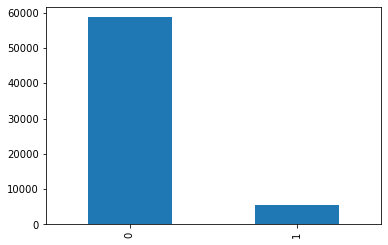

In [8]:
### Con este plot observamos a la variable target en nuestro dataset. 
df_train['hospital_death'].value_counts().plot(kind='bar')

In [9]:
from dash import Dash, dcc, html
import plotly.express as px
import pandas as pd


app = Dash(__name__)

fig2 = px.scatter(df_train, x='age', y='apache_3j_bodysystem',
                 size='patient_id', 
                 color="hospital_death", hover_name="gender",
                 log_x=True, size_max=60)

app.layout = html.Div([
    dcc.Graph(
        id='life-exp-vs-gdp',
        figure=fig2
    )
])



#### Un análisis que me parecia muy interesante y muy visual a primera vista. En este gráfico observamos en función de la edad y el problema médico por el que fue ingresado el paciente en el hospital. Se observan varios problemas médicos mortales con edades dispares. Por ejemplo, el trauma y el problema cardiovascular se aprecia con un indice de mortalidad más claro en pacientes de 20 a 40 años. Sin embargo, problemas hematológicos, gastrointestinales o respiratorios se aprecian a una mayor edad de más de 60 años.

In [10]:
fig2.show()

#### Como el preprocesado lo queremos hacer conjuntamente más adelante, procedemos a añadir una columna que llamaremos 'tipo_dato' en ambos datasets para poder identificar y separar en su momento los datos de entrenamiento de los de test.

In [11]:
df_train["tipo_dato"] = "train"
df_test["tipo_dato"] = "test"

#### Nuestra variable target, como bien hemos explicado al inicio, será 'hospital_death', la cual es un booleano que nos dirá si el paciente ha fallecido en el hospital = True = 1 o, por el contrario ha sobrevivido = False = 0. Mediante la función loc extraemos el target de cada id del paciente del dataset de entrenamiento, contruyendo así el dataframe target.

In [12]:
df_target = df_train.loc[:, ['patient_id', 'hospital_death']]

In [13]:
### Dropeamos la variable target del dataset de entrenamiento, igualando así el número de variables de train y test, 
### teniendo ya separado la variable target en el df de target.
df_train = df_train.drop(['hospital_death'], axis=1)

In [14]:
df_train.head()

,Unnamed: 0,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,...,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,tipo_dato
0,82707,36751,69039,158,66.0,35.693127,0,Caucasian,F,152.4,...,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,train
1,80002,68336,127397,47,48.0,18.966902,0,African American,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,train
2,54817,71682,77670,27,76.0,19.278960,0,Caucasian,M,173.0,...,0.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular,NaN,train
3,44799,114267,19566,100,43.0,45.617284,0,Caucasian,M,180.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Genitourinary,Renal/Genitourinary,NaN,train
4,50277,128055,104990,189,86.0,26.756678,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,train


df_target.shape

In [15]:
len(df_target.patient_id.unique())

64199

#### Cada paciente es único, como hemos podido comprobar, por lo tanto no habrá ningun problema con el target. Ahora, una vez visto el tamaño de los distintos dataset de entrenamiento, test y target uniremos los dos primeros para poder hacer un análisis descriptivo y un preprocesado correcto.

In [16]:
df_union = pd.concat([df_train, df_test])
### También pondremos como índice el id del paciente al ser id únicos.
df_union.set_index(['patient_id'], inplace=True)

In [17]:
df_union.head()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,...,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,tipo_dato
patient_id,,,,,,,,,,,,,,,,,,,,,
69039,82707,36751,158,66.0,35.693127,0,Caucasian,F,152.4,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,train
127397,80002,68336,47,48.0,18.966902,0,African American,F,165.1,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,train
77670,54817,71682,27,76.0,19.278960,0,Caucasian,M,173.0,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular,NaN,train
19566,44799,114267,100,43.0,45.617284,0,Caucasian,M,180.0,Floor,...,0.0,0.0,0.0,0.0,0.0,0.0,Genitourinary,Renal/Genitourinary,NaN,train
104990,50277,128055,189,86.0,26.756678,0,Caucasian,F,154.9,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,train


In [18]:
df_union.shape

(91713, 85)

In [19]:
### Dividimos el dataset en variables categóricas y en variables numéricas
cat = df_union.select_dtypes(include=['object']).columns
num = df_union.select_dtypes(exclude=['object']).columns

In [20]:
df_union[cat].describe()

,ethnicity,gender,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem,tipo_dato
count,90318,91688,91601,91713,91713,90051,90051,91713
unique,6,2,5,3,8,11,10,2
top,Caucasian,M,Accident & Emergency,admit,Med-Surg ICU,Cardiovascular,Cardiovascular,train
freq,70684,49469,54060,86183,50586,29999,38816,64199


In [21]:
df_union[num].describe()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,weight,...,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,Unnamed: 83
count,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,88993.000000,...,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,0.0
mean,45856.000000,65606.079280,105.669262,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,84.028340,...,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638,NaN
std,26475.406956,37795.088538,62.854406,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,25.011497,...,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169,NaN
min,0.000000,1.000000,2.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,38.600000,...,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,22928.000000,32852.000000,47.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,66.800000,...,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
50%,45856.000000,65665.000000,109.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,80.300000,...,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
75%,68784.000000,98342.000000,161.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,97.100000,...,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
max,91712.000000,131051.000000,204.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,186.000000,...,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN


In [22]:
### Comprobamos que tipo de datos tenemos en cada variable.
df_union.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91713 entries, 69039 to 105358
Data columns (total 85 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     91713 non-null  int64  
 1   encounter_id                   91713 non-null  int64  
 2   hospital_id                    91713 non-null  int64  
 3   age                            87485 non-null  float64
 4   bmi                            88284 non-null  float64
 5   elective_surgery               91713 non-null  int64  
 6   ethnicity                      90318 non-null  object 
 7   gender                         91688 non-null  object 
 8   height                         90379 non-null  float64
 9   icu_admit_source               91601 non-null  object 
 10  icu_id                         91713 non-null  int64  
 11  icu_stay_type                  91713 non-null  object 
 12  icu_type                       91713 non-

## PREPROCESADO

In [23]:
### Primero he de quitar el limitador de visualización de datos para poder visualizar todas las variables.
pd.set_option('display.width', 1000)  
pd.set_option('display.max_rows', None)  

df_union.isnull().sum()

Unnamed: 0                           0
encounter_id                         0
hospital_id                          0
age                               4228
bmi                               3429
elective_surgery                     0
ethnicity                         1395
gender                              25
height                            1334
icu_admit_source                   112
icu_id                               0
icu_stay_type                        0
icu_type                             0
pre_icu_los_days                     0
weight                            2720
apache_2_diagnosis                1662
apache_3j_diagnosis               1101
apache_post_operative                0
arf_apache                         715
gcs_eyes_apache                   1901
gcs_motor_apache                  1901
gcs_unable_apache                 1037
gcs_verbal_apache                 1901
heart_rate_apache                  878
intubated_apache                   715
map_apache               

In [24]:
### La variable Unnamed: 83 es una variable vacía, no aporta ningún valor al dataset, 
### por lo tanto la eliminaremos totalmente.
del(df_union['Unnamed: 83'])

In [25]:
edad = df_union['age'].value_counts(ascending=False)

In [26]:
edad.head(10)

67.0    2271
68.0    2173
71.0    2141
72.0    2110
66.0    2059
65.0    2051
70.0    2032
63.0    1977
73.0    1972
64.0    1956
Name: age, dtype: int64

#### Respecto a la variable de edad observamos que el grueso de datos, en el caso de comprobación, las 10 edades más representadas en el dataset, observamos que se encuentran en una edad <= 63 años. Esta variable es facilmente interpretable, debido a que el factor de la edad es muy identificativo con los problemas de salud y en consecuencia con el hecho natural del fallecimiento. Esta importancia relativa a esta variable nos hará dilucidar como tratar los nulos pertenecientes a la misma. Debido al peso natural de la variable edad, eliminaremos las filas nulas de dicha variable, descartando por ello, a los pacientes que no tienen una edad registrada. 

/Users/alejandromartinruiz/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='age'>

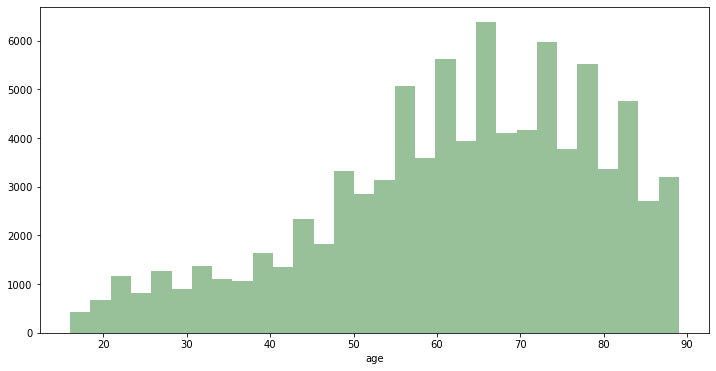

In [27]:
plt.figure(figsize=(12,6))
sns.distplot(df_union['age'].dropna(),kde=False,color='darkgreen',bins=30)

In [28]:
## Valores nulos descartados
df_union = df_union[df_union['age'].notna()]
df_union = df_union[df_union['d1_potassium_max'].notna()]
df_union = df_union[df_union['d1_potassium_min'].notna()]
df_union = df_union[df_union['apache_2_diagnosis'].notna()]
df_union = df_union[df_union['apache_3j_diagnosis'].notna()]
df_union = df_union[df_union['heart_rate_apache'].notna()]
df_union = df_union[df_union['map_apache'].notna()]
df_union = df_union[df_union['resprate_apache'].notna()]
df_union = df_union[df_union['weight'].notna()]
df_union = df_union[df_union['h1_mbp_noninvasive_max'].notna()]
df_union = df_union[df_union['apache_4a_hospital_death_prob'].notna()]
df_union = df_union[df_union['h1_resprate_max'].notna()]
df_union = df_union[df_union['h1_spo2_max'].notna()]
df_union = df_union[df_union['d1_glucose_max'].notna()]
df_union = df_union[df_union['h1_sysbp_max'].notna()]
df_union = df_union[df_union['h1_sysbp_noninvasive_max'].notna()]
df_union = df_union[df_union['h1_heartrate_max'].notna()]
df_union = df_union[df_union['h1_diasbp_noninvasive_max'].notna()]

In [29]:
df_union.shape

(60499, 84)

In [30]:
## Valores nulos sustituidos por la media de la variable
df_union['gcs_eyes_apache']=df_union['gcs_eyes_apache'].fillna(df_union['gcs_eyes_apache'].mean())
df_union['gcs_motor_apache']=df_union['gcs_motor_apache'].fillna(df_union['gcs_motor_apache'].mean())
df_union['gcs_verbal_apache']=df_union['gcs_verbal_apache'].fillna(df_union['gcs_verbal_apache'].mean())
df_union['temp_apache']=df_union['temp_apache'].fillna(df_union['temp_apache'].mean())
df_union['d1_diasbp_max']=df_union['d1_diasbp_max'].fillna(df_union['d1_diasbp_max'].mean())
df_union['d1_diasbp_min']=df_union['d1_diasbp_min'].fillna(df_union['d1_diasbp_min'].mean())
df_union['d1_diasbp_noninvasive_max']=df_union['d1_diasbp_noninvasive_max'].fillna(df_union['d1_diasbp_noninvasive_max'].mean())
df_union['d1_diasbp_noninvasive_min']=df_union['d1_diasbp_noninvasive_min'].fillna(df_union['d1_diasbp_noninvasive_min'].mean())
df_union['d1_mbp_max']=df_union['d1_mbp_max'].fillna(df_union['d1_mbp_max'].mean())
df_union['d1_mbp_min']=df_union['d1_mbp_min'].fillna(df_union['d1_mbp_min'].mean())
df_union['d1_mbp_noninvasive_max']=df_union['d1_mbp_noninvasive_max'].fillna(df_union['d1_mbp_noninvasive_max'].mean())
df_union['d1_mbp_noninvasive_min']=df_union['d1_mbp_noninvasive_min'].fillna(df_union['d1_mbp_noninvasive_min'].mean())
df_union['d1_resprate_max']=df_union['d1_resprate_max'].fillna(df_union['d1_resprate_max'].mean())
df_union['d1_resprate_min']=df_union['d1_resprate_min'].fillna(df_union['d1_resprate_min'].mean())
df_union['bmi']=df_union['bmi'].fillna(df_union['bmi'].mean())
df_union['height']=df_union['height'].fillna(df_union['height'].mean())
df_union['d1_temp_max']=df_union['d1_temp_max'].fillna(df_union['d1_temp_max'].mean())
df_union['d1_temp_min']=df_union['d1_temp_min'].fillna(df_union['d1_temp_min'].mean())
df_union['icu_admit_source']=df_union['icu_admit_source'].fillna(method="bfill") ### siguiente fila relleno

#### Las variables de etnia y genero trataremos los nulos rellenando con un dato de otro o desconocido. En gcs_unable_apache buscaremos el valor más repetido que es 0.

In [31]:
df_union['ethnicity'].unique()

array(['Caucasian', 'Hispanic', 'African American', nan, 'Asian',
       'Other/Unknown', 'Native American'], dtype=object)

In [32]:
df_union['ethnicity']=df_union['ethnicity'].fillna('Other/Unknown')

In [33]:
df_union['gender'].unique()


array(['F', 'M', nan], dtype=object)

In [34]:
df_union['gender']=df_union['gender'].fillna('Other')

<AxesSubplot:>

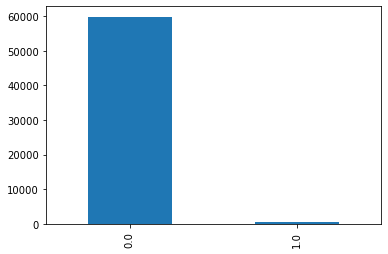

In [35]:
df_union['gcs_unable_apache'].value_counts().plot(kind='bar')

In [36]:
df_union['gcs_unable_apache']=df_union['gcs_unable_apache'].fillna(0)

In [37]:
df_union.isnull().sum()

Unnamed: 0                       0
encounter_id                     0
hospital_id                      0
age                              0
bmi                              0
elective_surgery                 0
ethnicity                        0
gender                           0
height                           0
icu_admit_source                 0
icu_id                           0
icu_stay_type                    0
icu_type                         0
pre_icu_los_days                 0
weight                           0
apache_2_diagnosis               0
apache_3j_diagnosis              0
apache_post_operative            0
arf_apache                       0
gcs_eyes_apache                  0
gcs_motor_apache                 0
gcs_unable_apache                0
gcs_verbal_apache                0
heart_rate_apache                0
intubated_apache                 0
map_apache                       0
resprate_apache                  0
temp_apache                      0
ventilated_apache   

In [38]:
df_union.shape

(60499, 84)

#### Una vez después de haber limpiado el dataset de nulos tendremos que ver que tipo de variables nos encontramos, ya que habrá que convertir las categóricas a numéricas.

In [39]:
df_union.dtypes

Unnamed: 0                         int64
encounter_id                       int64
hospital_id                        int64
age                              float64
bmi                              float64
elective_surgery                   int64
ethnicity                         object
gender                            object
height                           float64
icu_admit_source                  object
icu_id                             int64
icu_stay_type                     object
icu_type                          object
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int64
arf_apache                       float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                float64
gcs_verbal_apache                float64
heart_rate_apache                float64
intubated_apache

#### Como podemos observar no hay muchas variables categóricas, esto nos facilitará el cambio a numéricas. Podemos observar que no tenemos ninguna binaria (no booleanos), hay una que se podría convertir en variable dummie y transformarla de dicha forma, pero debido a que el tercer dato es ínfimo no valdrá la pena sacar 3 variables de dicha columna. Dicho esto, usaremos Label Encoder para tratar las categóricas. 

In [40]:
encoder=LabelEncoder()
df_union['_Ethnicity']=encoder.fit_transform(df_union.ethnicity.values)
del(df_union['ethnicity'])
df_union['_Gender']=encoder.fit_transform(df_union.gender.values)
del(df_union['gender'])
df_union['_Icu_admit_source']=encoder.fit_transform(df_union.icu_admit_source.values)
del(df_union['icu_admit_source'])
df_union['_Icu_type']=encoder.fit_transform(df_union.icu_type.values)
del(df_union['icu_type'])
df_union['_Apache_3j_bodysystem']=encoder.fit_transform(df_union.apache_3j_bodysystem.values)
del(df_union['apache_3j_bodysystem'])
df_union['_Apache_2_bodysystem']=encoder.fit_transform(df_union.apache_2_bodysystem.values)
del(df_union['apache_2_bodysystem'])
df_union['Icu_stay_type']=encoder.fit_transform(df_union.icu_stay_type.values)
del(df_union['icu_stay_type'])

In [41]:
df_union.dtypes

Unnamed: 0                         int64
encounter_id                       int64
hospital_id                        int64
age                              float64
bmi                              float64
elective_surgery                   int64
height                           float64
icu_id                             int64
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int64
arf_apache                       float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                float64
gcs_verbal_apache                float64
heart_rate_apache                float64
intubated_apache                 float64
map_apache                       float64
resprate_apache                  float64
temp_apache                      float64
ventilated_apache                float64
d1_diasbp_max   

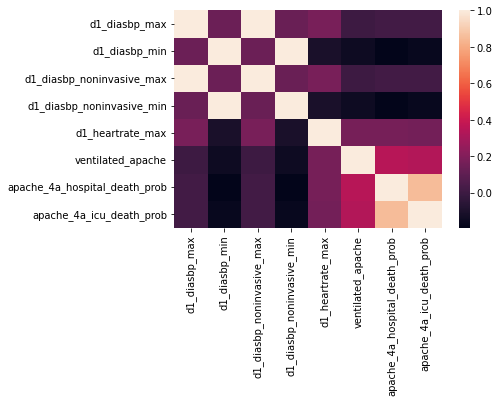

In [42]:
list_correlacion = ['d1_diasbp_max', 'd1_diasbp_min',\
       'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min',\
       'd1_heartrate_max',
       'ventilated_apache', 'apache_4a_hospital_death_prob',\
       'apache_4a_icu_death_prob']
df_relacion = df_union[list_correlacion]
correlation_mat = df_relacion.corr()
sns.heatmap(correlation_mat)
plt.show()

#### Para el gráfico de correlación he decido usar las dos variables de probabilidad traidas del score de APACHE III, un puntuaje que será muy importante en este dataset. Las he utilizado como principal reclamo para encontrar correlaciones con la posible muerte de un paciente. Se puede ver a primera vista que "ventilated_apache" y "d1_heartrate_max" serán las que mayor correlación mantendrán con estas dos variables, las cuales serán las más potentes de todas ellas.

#### Ahora veremos los diferentes outliers que nos podremos encontrar en las distintas variables, los cuales intentaremos tratar para hacer un modelo más ajustado.

hospital_id


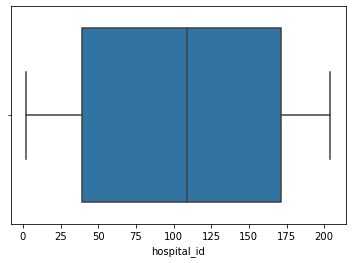

age


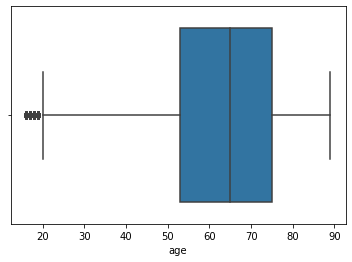

bmi


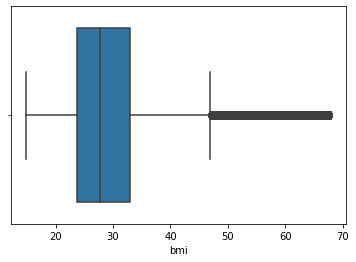

height


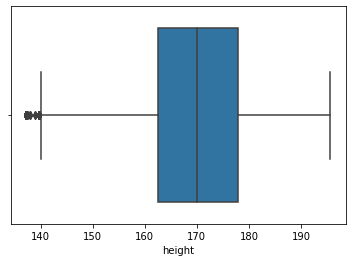

icu_id


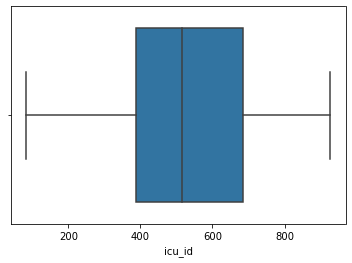

pre_icu_los_days


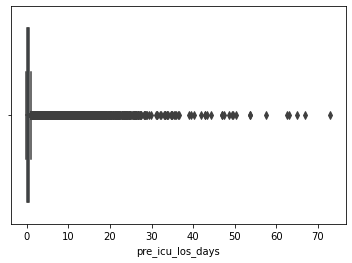

weight


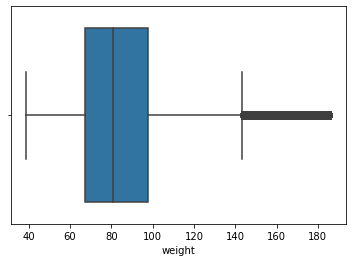

apache_2_diagnosis


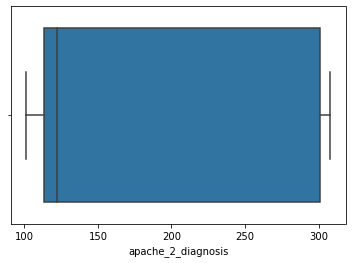

apache_3j_diagnosis


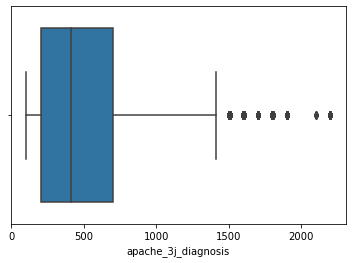

heart_rate_apache


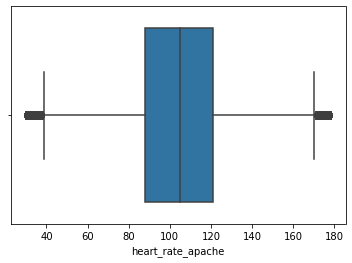

map_apache


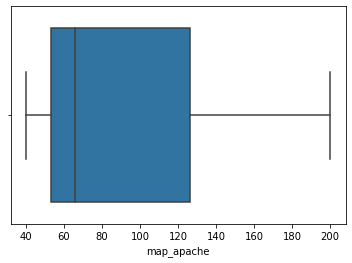

resprate_apache


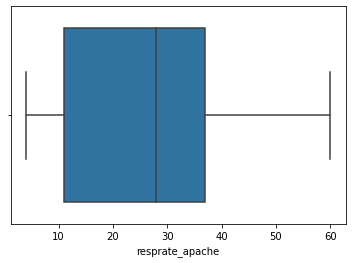

temp_apache


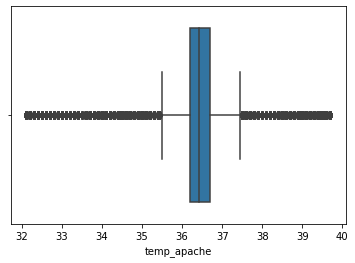

ventilated_apache


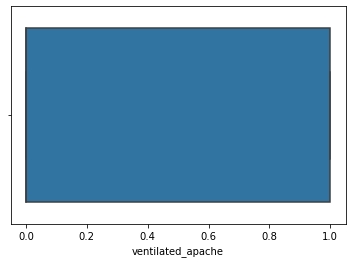

d1_diasbp_max


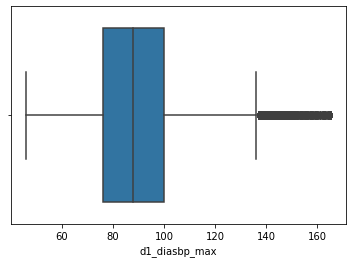

d1_diasbp_min


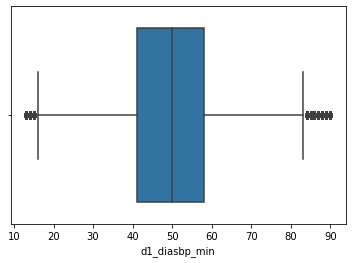

d1_diasbp_noninvasive_max


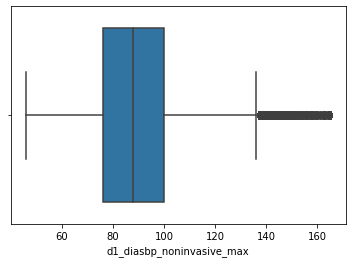

d1_diasbp_noninvasive_min


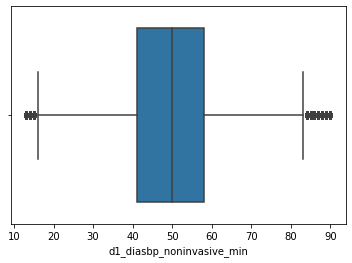

d1_heartrate_max


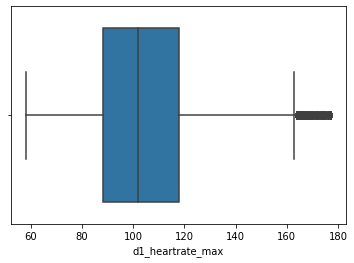

d1_heartrate_min


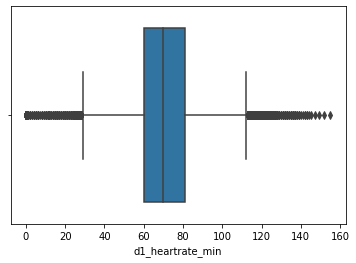

d1_mbp_max


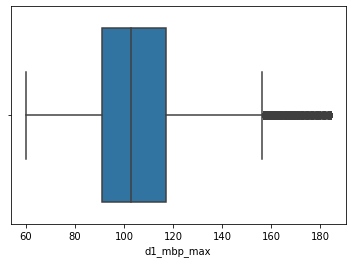

d1_mbp_min


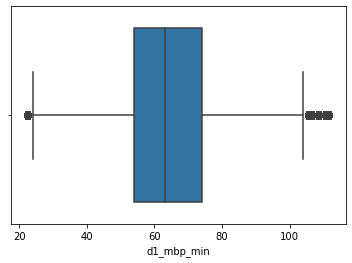

d1_mbp_noninvasive_max


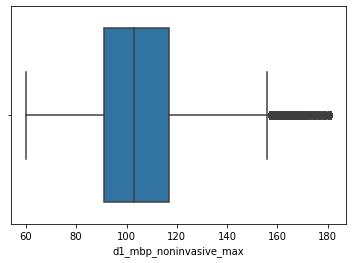

d1_mbp_noninvasive_min


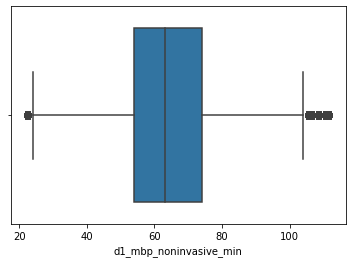

d1_resprate_max


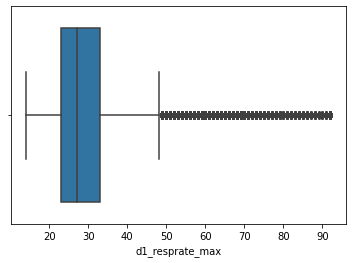

d1_resprate_min


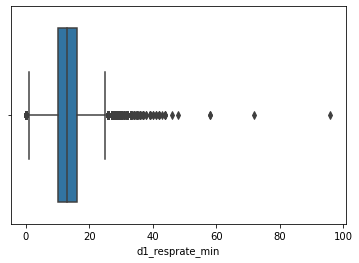

d1_spo2_max


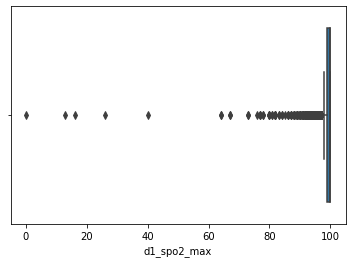

d1_spo2_min


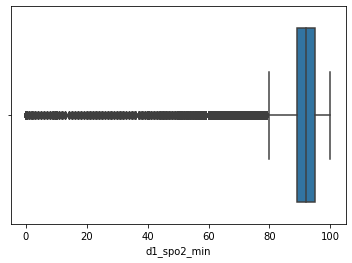

d1_sysbp_max


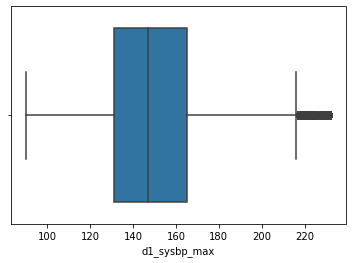

d1_sysbp_min


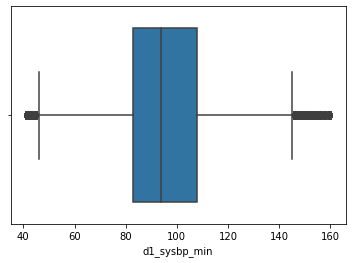

d1_sysbp_noninvasive_max


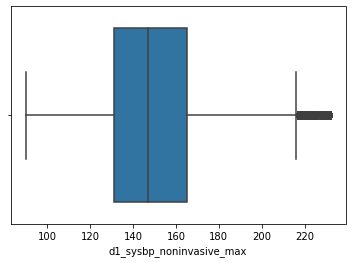

d1_sysbp_noninvasive_min


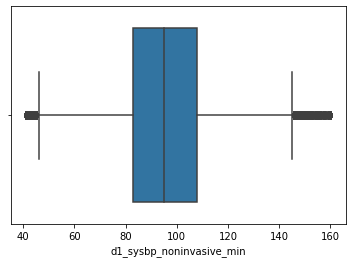

d1_temp_max


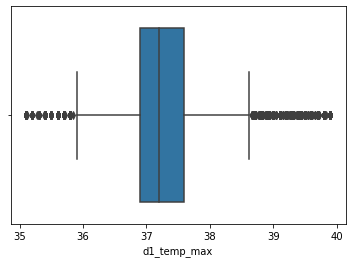

d1_temp_min


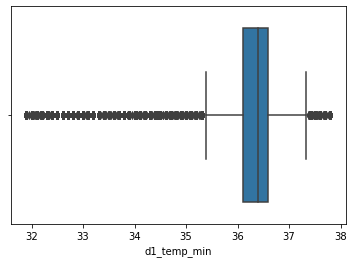

h1_diasbp_max


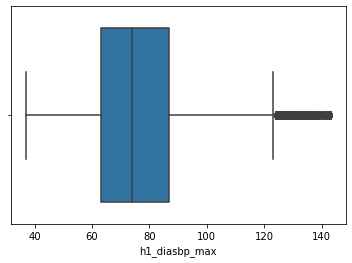

h1_diasbp_min


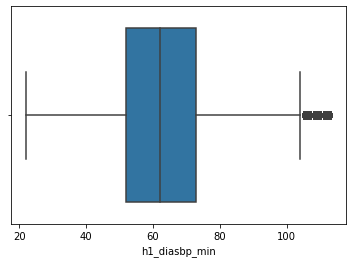

h1_diasbp_noninvasive_max


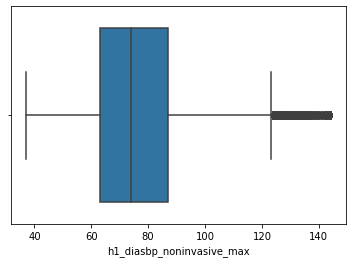

h1_diasbp_noninvasive_min


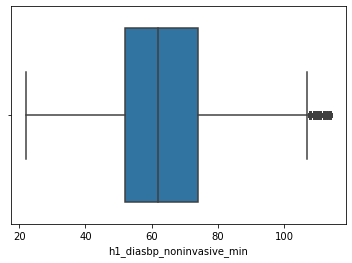

h1_heartrate_max


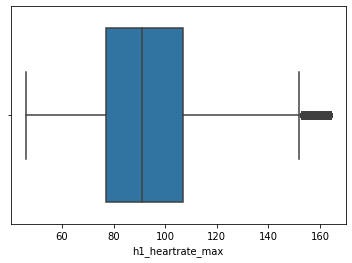

h1_heartrate_min


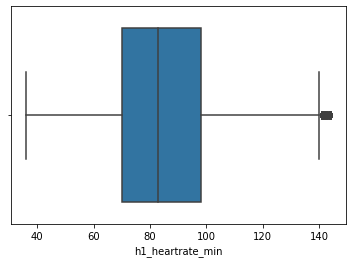

h1_mbp_max


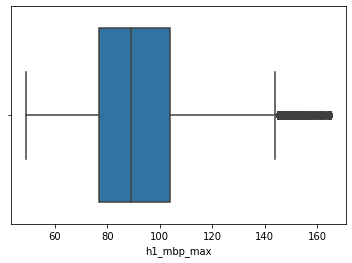

h1_mbp_min


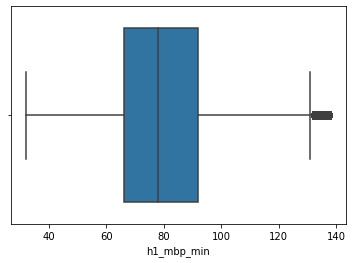

h1_mbp_noninvasive_max


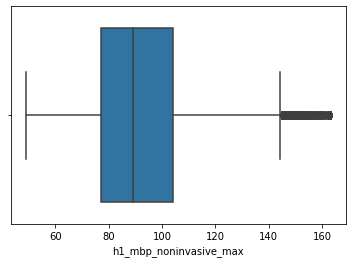

h1_mbp_noninvasive_min


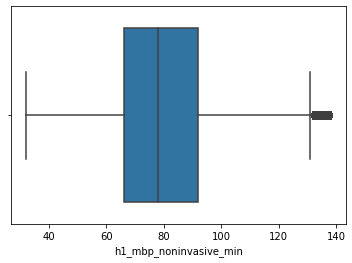

h1_resprate_max


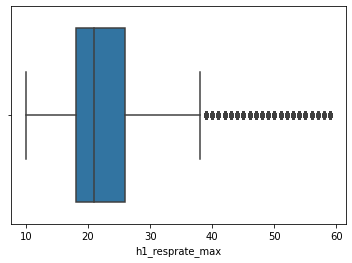

h1_resprate_min


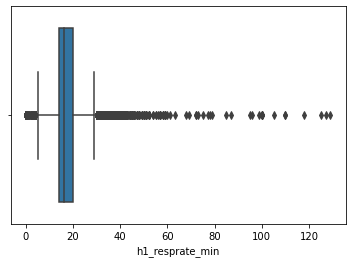

h1_spo2_max


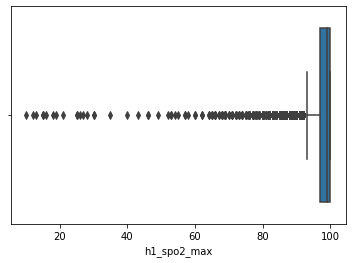

h1_spo2_min


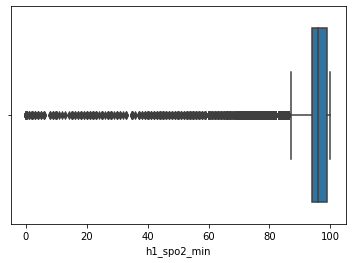

h1_sysbp_max


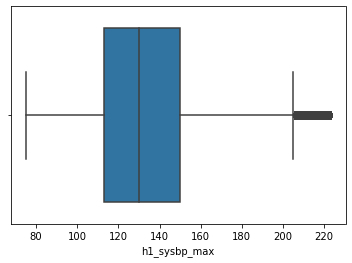

h1_sysbp_min


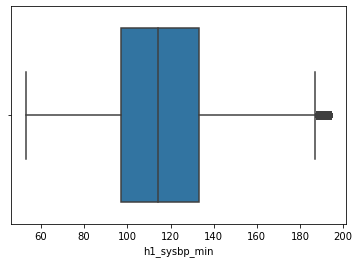

h1_sysbp_noninvasive_max


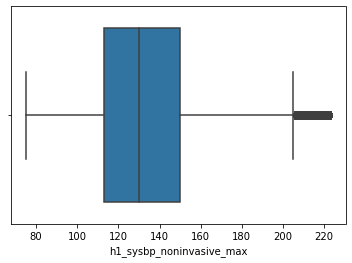

h1_sysbp_noninvasive_min


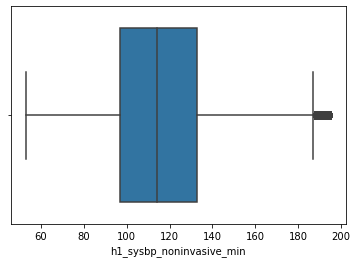

d1_glucose_max


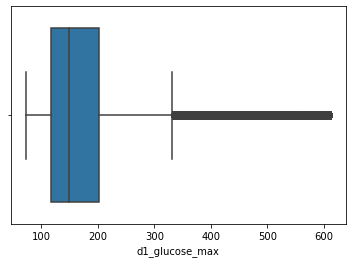

d1_glucose_min


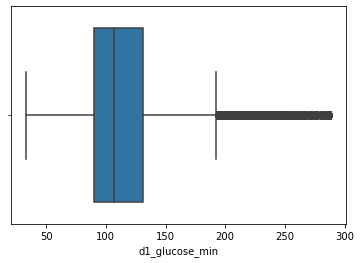

d1_potassium_max


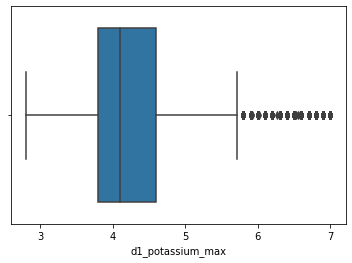

d1_potassium_min


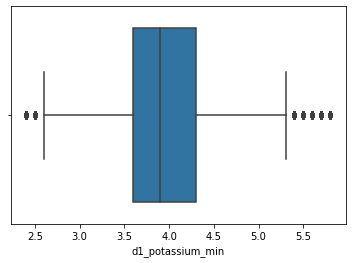

apache_4a_hospital_death_prob


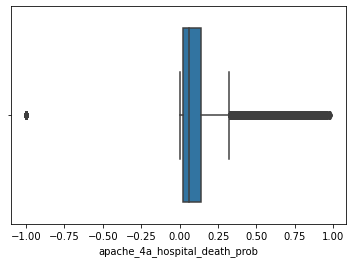

apache_4a_icu_death_prob


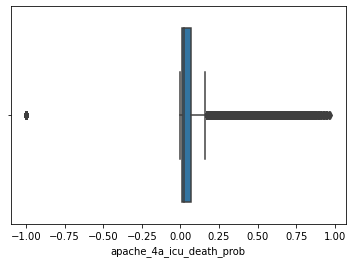

In [43]:
list_correlacion2 = ['hospital_id', 'age', 'bmi','height',\
       'icu_id', 'pre_icu_los_days', 'weight',\
       'apache_2_diagnosis', 'apache_3j_diagnosis','heart_rate_apache',\
        'map_apache', 'resprate_apache', 'temp_apache',\
       'ventilated_apache', 'd1_diasbp_max', 'd1_diasbp_min',\
       'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min',\
       'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min',\
       'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max',\
       'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max',\
       'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min',\
       'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min',\
       'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min',\
       'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp_max', 'h1_mbp_min',\
       'h1_mbp_noninvasive_max', 'h1_mbp_noninvasive_min', 'h1_resprate_max',\
       'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min', 'h1_sysbp_max',\
       'h1_sysbp_min', 'h1_sysbp_noninvasive_max', 'h1_sysbp_noninvasive_min',\
       'd1_glucose_max', 'd1_glucose_min', 'd1_potassium_max',\
       'd1_potassium_min', 'apache_4a_hospital_death_prob',\
       'apache_4a_icu_death_prob']
for i in list_correlacion2:
    sns.boxplot(x=df_union[i])
    print(i)
    plt.show()

In [44]:
### Tratamiento de Outliers mediante Inter-Quartile Range
def outliers(df, ft):
    Q1 = df[ft].quantile(0.25)
    Q3 = df[ft].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    ls = df.index[ (df[ft] < lower_bound) | (df[ft] > upper_bound)]
    
    return ls

#### En este tratamiento de outliers he decidido tratar las siguientes variables: ['apache_3j_diagnosis', 'heart_rate_apache', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min'], el resto las he considerado porque aunque el valor estuviese lejos del grueso de datos no suponían un problema para el análisis, por ejemplo, los outliers de las variables edad, estatura y peso eran simplemente características de otro tipo de pacientes más diferente al rango común.

In [45]:
index_list = []
for feature in ['apache_3j_diagnosis', 'heart_rate_apache', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min']:
    index_list.extend(outliers(df_union, feature))

In [47]:
def remove(df, ls):
    ls = sorted(set(ls))
    df = df.drop(ls)
    return df

In [48]:
df_union_cleaned = remove(df_union, index_list)

In [49]:
df_union_cleaned.shape

(50108, 84)

apache_3j_diagnosis


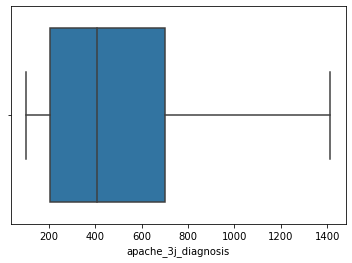

heart_rate_apache


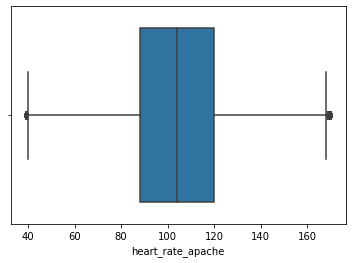

h1_resprate_min


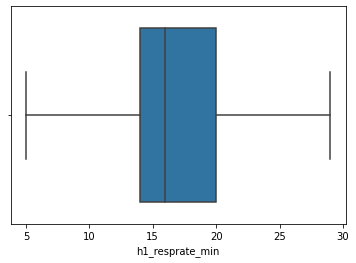

h1_spo2_max


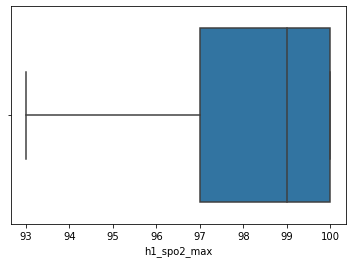

h1_spo2_min


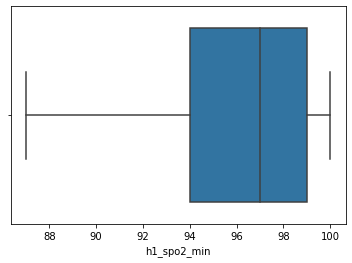

In [50]:
### Comprobamos que no hay outliers y se han tratado correctamente
list_correlacion3 = ['apache_3j_diagnosis', 'heart_rate_apache', 'h1_resprate_min', 'h1_spo2_max', 'h1_spo2_min']
for i in list_correlacion3:
    sns.boxplot(x=df_union_cleaned[i])
    print(i)
    plt.show()

In [51]:
df_union_cleaned.to_csv('traintest_cleaned.csv', index=False)

In [52]:
df_target.set_index('patient_id', inplace=True)

In [53]:
df_target.shape

(64199, 1)

In [54]:
df_target.hospital_death.unique()

array([0, 1])

In [55]:
df_target.head()

,hospital_death
patient_id,
69039,0
127397,1
77670,0
19566,0
104990,1


In [56]:
df_t = pd.merge(df_union_cleaned[df_union_cleaned['tipo_dato']=='train'], df_target, on='patient_id', how='left')

#### Una vez mergeado el dataset sacamos la correlación de variables, pudiendo apreciar el impacto que tienen sobre la muerte de un paciente en el hospital.

In [57]:
corr = abs(df_t.corr())
corr[['hospital_death']].sort_values(by = 'hospital_death',ascending = False).style.background_gradient()

,hospital_death
hospital_death,1.000000
apache_4a_hospital_death_prob,0.312825
apache_4a_icu_death_prob,0.290189
gcs_motor_apache,0.236107
gcs_eyes_apache,0.217731
gcs_verbal_apache,0.206479
ventilated_apache,0.203114
d1_temp_min,0.185644
d1_sysbp_noninvasive_min,0.171179
d1_sysbp_min,0.171068


#### La correlación de las distintas variables con la variable target es muy esclarecedora. Podemos encontrar "apache_4a_hospital_death_prob" y "apache_4a_icu_death_prob"	como las 2 más importantes. Son dos variables que vienen de una probabilidad dada por la variable APACHE III diagnósis, teniendo en cuenta las avriables ICU, que describen el tipo de problema de salud del paciente y que condiciones generales había. Por ejemplo: en que unidad hospitalaria ha sido admitido, si fue admitido de primeras o transferido a esa unidad, que tipo de cuidado se le ha podido dar en dicha unidad, etc

In [58]:
del(df_t['tipo_dato'])

In [59]:
def proporciones_final (var,target,df):

    proporcion = pd.DataFrame()
    
    proporcion['%fugas'] = df[target].groupby(df[var]).mean()*100
    proporcion['Conteo'] = df[target].groupby(df[var]).count()
    proporcion= proporcion.round(3)   
    proporcion_filtered = proporcion[(proporcion['%fugas']>0) & (proporcion['Conteo']>10)]  
        
    if len(proporcion_filtered)<100 and len(proporcion_filtered)>1:
        fig = plt.figure()
        ax = proporcion_filtered['Conteo'].plot(kind='bar',grid=True)
                
        ax2 = ax.twinx()
        ax2.plot(proporcion_filtered['%fugas'].values, linestyle='-', linewidth=2.0,color='g')
        plt.ylim(0, 100) # modificación.
        plt.tight_layout()   
        
    else:        
        proporcion_filtered.reset_index(inplace=True)
        sns.lmplot(x = var,y ='%fugas', data=proporcion_filtered,fit_reg=True,ci=None)

/Users/alejandromartinruiz/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



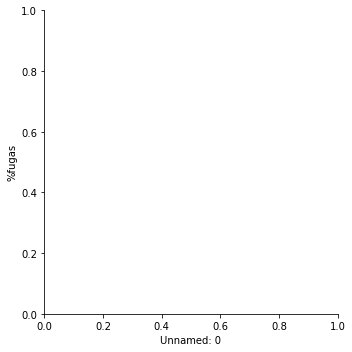

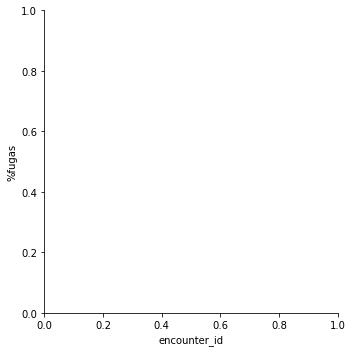

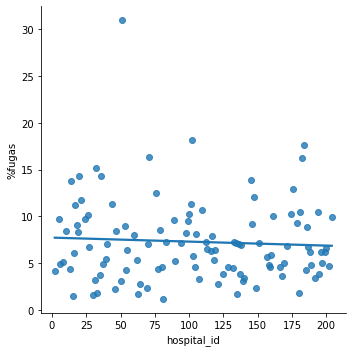

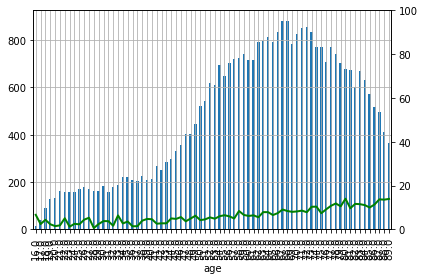

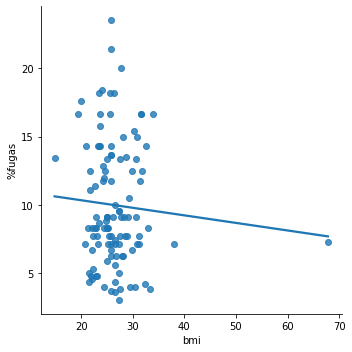

...

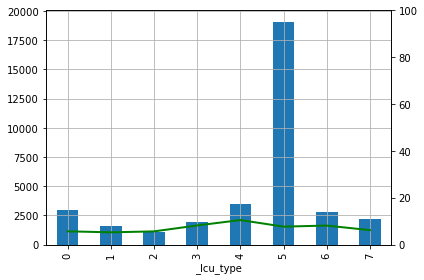

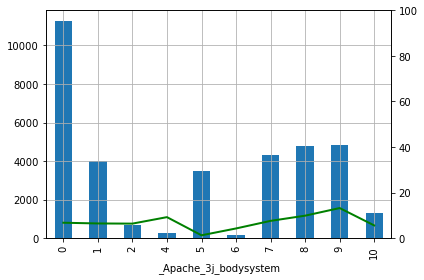

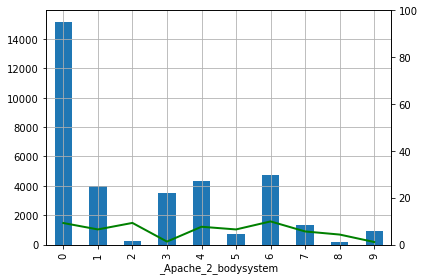

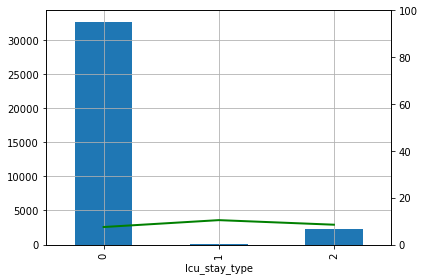

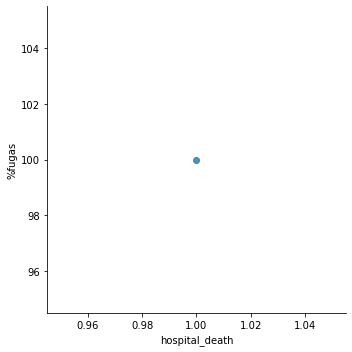

In [60]:
for i in df_t.columns:
    proporciones_final (i, 'hospital_death', df_t)

## Modelado y entrenamiento

In [61]:
X_train, X_test, y_train, y_test = train_test_split (df_t.drop('hospital_death', axis=1), 
                                                     df_t.hospital_death,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = df_t.hospital_death)

In [62]:
def saca_metricas(y_real, y_pred): 
    false_positive_rate, recall, thresholds = roc_curve(y_real, y_pred)
    roc_auc = auc(false_positive_rate, recall)
    print('- AUC: {roc_auc}')
    plt.plot(false_positive_rate, recall, 'b')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.title('AUC = %0.2f' % roc_auc)

- AUC: {roc_auc}


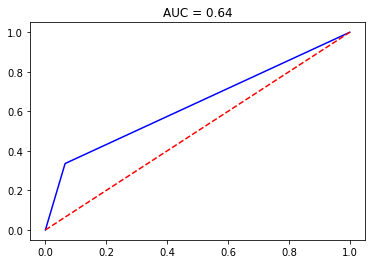

In [63]:
from sklearn.tree import DecisionTreeClassifier

# Modelo y predicciones:
tree_mod = DecisionTreeClassifier(criterion="gini").fit(X_train, y_train)
tree_pred = tree_mod.predict(X_test)

# Métricas:
saca_metricas(y_test, tree_pred)

In [64]:
X_train.columns

Index(['Unnamed: 0', 'encounter_id', 'hospital_id', 'age', 'bmi', 'elective_surgery', 'height', 'icu_id', 'pre_icu_los_days', 'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'heart_rate_apache', 'intubated_apache', 'map_apache', 'resprate_apache', 'temp_apache', 'ventilated_apache', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min', 'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max', 'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max', 'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min', 'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min', 'h1_heartrate_max', 'h1_heartrate_min', 'h1_mbp_max', 'h1_mbp_min', 'h1_mbp_noninvasive_max',
     

In [65]:
classifier2 = RandomForestClassifier().fit(X_train, y_train)
pred2 = classifier2.predict(X_test)

- AUC: {roc_auc}


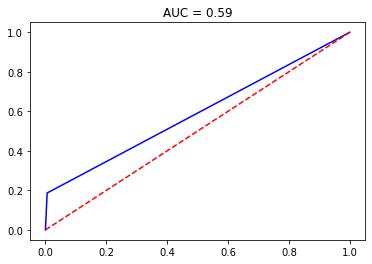

In [66]:
saca_metricas(y_test, pred2)

In [67]:
classifier3 = LinearSVC(penalty='l1', dual= False).fit(X_train, y_train)
pred3 = classifier3.predict(X_test)

/Users/alejandromartinruiz/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



- AUC: {roc_auc}


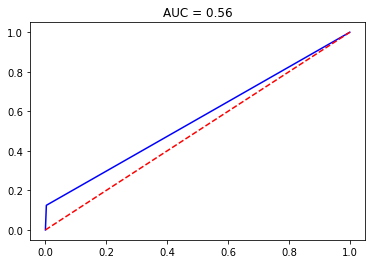

In [68]:
saca_metricas(y_test, pred3)

In [69]:
classifier4 = LogisticRegression().fit(X_train, y_train)
pred4 = classifier4.predict(X_test)

/Users/alejandromartinruiz/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



- AUC: {roc_auc}


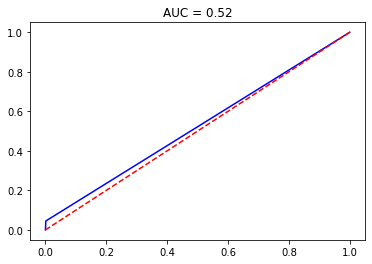

In [70]:
saca_metricas(y_test, pred4)

#### Una vez probado con diferentes modelos escogemos el que mejor se nos ajusta. De primeras el que nos muestra una mayor curva ROC es el modelo de árboles de decisión, escogeremos ese mismo debido que es al que mejor rendimiento nos da y el que mayor "calidad" ofrece. Ahora haremos la validación cruzada para asegurar que no hay overfitting.

In [71]:
# Validación cruzada

cv = cross_val_score(
    classifier2,
    X_train, 
    y_train,
    scoring = "roc_auc",
    cv = 5
)
print(cv)
print("CV ROC:", cv.mean(), np.std(cv))

[0.87454628 0.85534947 0.86192386 0.85160267 0.8598617 ]
CV ROC: 0.8606567946404191 0.007814094500334757


#### Obtenemos 5 predicciones donde la desviación típica es tan baja que nos aclara que no está sobreajustado.

## Entrenamiento y Evaluaciones 

In [72]:
imp = {}
for i in range(len(X_train.columns)):
    imp[X_train.columns[i]] = [classifier2.feature_importances_[i]]
pd.DataFrame.from_dict(imp, orient="index", columns=["Importance"]).sort_values("Importance", ascending=False).head(10).style.background_gradient()

,Importance
apache_4a_hospital_death_prob,0.167694
apache_4a_icu_death_prob,0.043142
d1_spo2_min,0.029549
d1_heartrate_min,0.026500
d1_temp_max,0.023221
d1_resprate_min,0.021668
bmi,0.020878
d1_glucose_max,0.020324
d1_temp_min,0.020048
d1_potassium_min,0.019668


 #### Después de haber modelado hemos sacado la importancia que da el modelo a las variables en el dataframe. La más importante, con clara distancia de las demás, es la variable "apache_4a_hospital_death_prob", la cual como se comenta en el anexo de variables es un dato sacado de un puntuaje del propio hospital. Es decir, proveniene de un análisis de probabilidad de posible muerte, lo cual se encuentra el sentido de su peso en este dataset. Observando otras variables podemos ver "d1_spo2_min" referido a la saturación de oxigeno (oxígeno en sangre) mínima del paciente en la unidad y "d1_heartrate_min" referido al ritmo cardiáco mínimo del paiciente, ambos señal de un grave problema médico si los niveles no son regulares o no se encuentran en la normalidad.

In [106]:
grid_param = {
    'n_estimators': [100,300,500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [16,20,22,24],
    'max_features': ['auto', 'sqrt'],

}

In [107]:
from sklearn.model_selection import StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=11)

In [108]:
model_grid = GridSearchCV(estimator=classifier2,
                     param_grid=grid_param,
                     scoring='roc_auc',
                     cv=stratified_kfold,
                     n_jobs=-1)

In [109]:
model_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=11, shuffle=True),
             estimator=RandomForestClassifier(criterion='entropy', max_depth=16,
                                              max_features='sqrt',
                                              n_estimators=50),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [16, 20, 22, 24],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [100, 300, 500]},
             scoring='roc_auc')

In [110]:
print(model_grid.best_params_)

{'criterion': 'entropy', 'max_depth': 24, 'max_features': 'auto', 'n_estimators': 500}


In [111]:
print(model_grid.best_score_)

0.8758220143981411


In [112]:
classifier2 = RandomForestClassifier(criterion = 'entropy', n_estimators= 500, max_depth = 24, max_features= 'auto').fit(X_train, y_train)
pred2 = classifier2.predict(X_test)

In [113]:
print(classification_report(y_test,pred2))

              precision    recall  f1-score   support

           0       0.94      0.99      0.97      6493
           1       0.73      0.19      0.30       530

    accuracy                           0.93      7023
   macro avg       0.83      0.59      0.63      7023
weighted avg       0.92      0.93      0.91      7023



In [114]:
### Balanceo de datos para el ajuste del modelo
def run_model_balanced(X_train, X_test, y_train, y_test):
    clf = LogisticRegression(C=1.0,penalty='l2',random_state=1,solver="newton-cg",class_weight="balanced")
    clf.fit(X_train, y_train)
    return clf
 
model = run_model_balanced(X_train, X_test, y_train, y_test)
pred_y = model.predict(X_test)

/Users/alejandromartinruiz/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:202: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



In [115]:
print(classification_report(y_test, pred_y))

              precision    recall  f1-score   support

           0       0.97      0.80      0.88      6493
           1       0.22      0.72      0.34       530

    accuracy                           0.79      7023
   macro avg       0.60      0.76      0.61      7023
weighted avg       0.92      0.79      0.84      7023



#### Hemos logrado apuntalar la precisión de la supervivencia, donde ha alcanzado el 97% de precisión. De esta forma estaríamos muy cerca de lograr un modelo de supervivencia óptimo, el cual el Falso Negativo fuese muy difícil que apareciera. Como hemos comentado antes, la sensibilidad del fallo con un Falso Negativo era muy muy delicada en el ámbito de salud, en especial si hablamos de supervivencia, ya que esta target crítica distribuiría capacitación sanitaria y la distribución de los recursos. Por ello, habría que tener especial cuidado de no desatender a estos Falsos Negativos, ya que supondría el fallecimiento de dichos pacientes sin haber recibido la atención necesaria.Sobre el recall se ha logrado equilibrar bastante con el balanceo, siendo antes muy posible identificar a los supervivientes pero con muchas dificultades respecto a los pacientes que fallecerán. Ahora podemos observar que en un 0.80 y 0.72 apuntalan el recall haciendo que se puedan identificar más casos con más efectividad. Dicho esto, la f1-score que combina precisión y recall mantiene en un buen porcentaje a los supervivientes y ve necesario seguir mejorando en el apartado de la precisión con los fallecimientos. Por último, debido al desbalanceo de clases no hemos usado el accuracy, ya que puede llevar a engaño, ya de primeras no es una métrica demasiado buena porque no es exacta, pero ya con desbalanceo entramos e una problemática si nos fijásemos en dicha métrica. Obviamente, será mucho mayor el número de supervivientes que de fallecimientos, por lo tanto el resultado que nos devolviese no sería certero.

#### Aplicamos nuestro modelo sobre el dataset de test para ver resultados y conclusiones

In [116]:
df_test_definitivo = pd.merge(df_union[df_union['tipo_dato']=='test'], df_target, on='patient_id', how='left')
df_test_definitivo.drop('tipo_dato', axis=1, inplace=True)

In [117]:
del(df_test_definitivo['hospital_death'])

In [118]:
df_test_definitivo.head()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,weight,...,leukemia,lymphoma,solid_tumor_with_metastasis,_Ethnicity,_Gender,_Icu_admit_source,_Icu_type,_Apache_3j_bodysystem,_Apache_2_bodysystem,Icu_stay_type
patient_id,,,,,,,,,,,,,,,,,,,,,
112951,68842,21017,166,57.0,24.161722,1,193.0,675,0.355556,90.0,...,0.0,0.0,0.0,2,1,2,7,10,7,0
123759,16041,64871,116,72.0,24.332277,0,188.0,286,0.143750,86.0,...,0.0,0.0,0.0,2,1,0,3,6,8,0
47970,42932,124400,100,52.0,27.625362,0,162.0,495,0.154167,72.5,...,0.0,0.0,0.0,2,0,0,5,5,3,0
73287,71761,58770,135,48.0,29.708393,0,152.4,705,0.050000,69.0,...,0.0,0.0,0.0,5,0,0,5,9,0,0
113052,2018,71841,81,51.0,23.067672,0,172.7,90,0.022917,68.8,...,0.0,0.0,0.0,2,1,0,5,5,3,0


In [119]:
modelo_proba = classifier2.predict_proba(df_test_definitivo)[:,1]
modelo_proba = (pd.DataFrame(modelo_proba,columns=['probabilidad'],index=df_test_definitivo.index))
modelo_proba.sort_values(by=['probabilidad'],ascending=False,axis=0,inplace=True)

In [128]:
modelo_proba.head()

,probabilidad
patient_id,
73795,0.838
114972,0.836
110373,0.810
52684,0.808
122182,0.808


In [130]:
modelo_proba.tail()

,probabilidad
patient_id,
76047,0.0
19892,0.0
128140,0.0
44581,0.0
96875,0.0


In [121]:
imp = {}
for i in range(len(X_train.columns)):
    imp[X_train.columns[i]] = [classifier2.feature_importances_[i]]
pd.DataFrame.from_dict(imp, orient="index", columns=["Importance"]).sort_values("Importance", ascending=False).head(10).style.background_gradient()

,Importance
apache_4a_hospital_death_prob,0.088565
apache_4a_icu_death_prob,0.072310
d1_spo2_min,0.020472
d1_sysbp_noninvasive_min,0.020262
apache_3j_diagnosis,0.020167
d1_sysbp_min,0.019580
pre_icu_los_days,0.018381
age,0.017998
d1_heartrate_max,0.017247
d1_heartrate_min,0.016912


#### Paciente con más probabilidad de fallecer

In [124]:
df_test_definitivo.loc[73795] 

Unnamed: 0                       47690.000000
encounter_id                     10360.000000
hospital_id                         21.000000
age                                 61.000000
bmi                                 37.987896
elective_surgery                     0.000000
height                             172.700000
icu_id                             513.000000
pre_icu_los_days                     0.051389
weight                             113.300000
apache_2_diagnosis                 113.000000
apache_3j_diagnosis                501.050000
apache_post_operative                0.000000
arf_apache                           0.000000
gcs_eyes_apache                      2.000000
gcs_motor_apache                     4.000000
gcs_unable_apache                    0.000000
gcs_verbal_apache                    1.000000
heart_rate_apache                  136.000000
intubated_apache                     1.000000
map_apache                         191.000000
resprate_apache                   

#### Paciente con menos probabilidad de fallecer

In [123]:
df_test_definitivo.loc[96875]

Unnamed: 0                       85624.000000
encounter_id                     15655.000000
hospital_id                        188.000000
age                                 26.000000
bmi                                 25.808960
elective_surgery                     0.000000
height                             180.300000
icu_id                             841.000000
pre_icu_los_days                     0.272222
weight                              83.900000
apache_2_diagnosis                 122.000000
apache_3j_diagnosis                703.020000
apache_post_operative                0.000000
arf_apache                           0.000000
gcs_eyes_apache                      4.000000
gcs_motor_apache                     6.000000
gcs_unable_apache                    0.000000
gcs_verbal_apache                    5.000000
heart_rate_apache                  120.000000
intubated_apache                     0.000000
map_apache                         119.000000
resprate_apache                   

## Conclusiones

#### Respecto a los dos pacientes requeridos como con más probabilidad de fallecer y con menos podemos ver: una gran diferencia en la variable apache_4a que es el score de APACHE III respecto a la mortandad. El paciente 1 con una prob de morir del 84% le dan un 75% de probabilidad de morir en dicho score, en cambio el paciente 2 se le da un 0. 
#### Respecto a la variable edad varia mucho, el 1 tiene 61 años y el paciente 2 tiene 23 años, una diferencia muy importante a la hora de determinar posibilidades de supervivencia o no. A su vez, la frecuencia respiratoria del paciente 1 es mayor, de ehcho quintuplica la del paciente 2.
#### Según el BMI del paciente 1 está obeso, superando los baremos en varios punto, el paciente 2 está en un peso normal. Respecto a la glucosa (los varemos normales están entre 70 y 100, el paciente 1 mantiene la mínima en 33, muy por debajo de lo normal, el paciente 2 en 87.

#### Sin duda alguna hay diferencias claves que suponen que la probabilidad de supervivencia sea mayor respecto a cualquier problema de salud. Algo que se puede entrar más en detalle a esclarecer dichos hechos.